In [1]:
import sys
sys.path.append('../')

import tensorflow as tf
import numpy as np

from tf_data_importer import load_training_tf_dataset

from sklearn.model_selection import train_test_split

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

# For sake of efficiency, tf.image has functions that will extract patches from images.
# Creating a custom layer for ease of use when creating the model.
# https://dzlab.github.io/notebooks/tensorflow/vision/classification/2021/10/01/vision_transformer.html


# Takes as input patch_size, which will be same along width and height
# As hformer uses overlapping slices to increase number of training samples, set the stride to a values less than patch_size.

# NOTE : The output shape is num_patches, patch_height, patch_width, patch_depth.
# The Fig1 of paper mentions input to input projection layer is 1 X H X W. Output of this layer is H X W X 1

class PatchExtractor(tf.keras.layers.Layer):
    def __init__(self, patch_size, stride,name):
        super(PatchExtractor, self).__init__(name=name)
        self.patch_size = patch_size
        self.stride = stride

    def call(self, images):
        # batch_size : number of images, which is not used.
        batch_size = tf.shape(images)[0] 
        # Expected to always be 1.
        patch_depth = images.shape[-1]
        
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.stride, self.stride, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patches = tf.reshape(patches, [-1, self.patch_size, self.patch_size, patch_depth])
        return patches
    
    

# NOTE : The paper does not mention what constitutes the input projection block.
# The ONLY thing mentioned in input is each image patch (that is 64x64). Input to the input projection block is 1 X H X W, and output is C X H X W

# NOTE (ASSUMPTIONS) : The input 'projection' block uses convolution (2x2) and C is the number of kernels.
# I chose 3x3 since the paper does not say what H, W.

# num_output_channels = C in the block diagram. NO activation function is used (assumed linear).
class InputProjectionLayer(tf.keras.layers.Layer):
    def __init__(self, num_output_channels, kernel_size=(2, 2), name="input_projection_layer", **kwargs):
        super(InputProjectionLayer, self).__init__(name=name, **kwargs)

        # Define the convolutional layer
        self.convolution = tf.keras.layers.Conv2D(filters=num_output_channels,
                                                  kernel_size=kernel_size,
                                                  strides=kernel_size,
                                                  padding='same', name="convolution_layer")

    def call(self, inputs):
        output = self.convolution(inputs)
        return output
    
    

# NOTE : The paper does not mention what constitutes the output projection block.
# The ONLY thing mentioned in input is of shape C X H X W and output is 1 X H X W

# NOTE (ASSUMPTIONS) : The output 'projection' block uses transposed convolution 2x2) and C is the value of C (num_features_maps).

# NO activation function is used (assumed linear).
# kernel_size must MATCH whatever was given to InputProjectionLayer
class OutputProjectionLayer(tf.keras.layers.Layer):
    def __init__(self, kernel_size=(2, 2), name="output_projection_layer", **kwargs):
        super(OutputProjectionLayer, self).__init__(name=name, **kwargs)

        # Define the deconvolutional layer
        self.transpose_conv2d = tf.keras.layers.Conv2DTranspose(filters=1,
                                                             kernel_size=kernel_size,
                                                             strides=kernel_size,
                                                             padding='same', name="transpose_convolution_2d_layer")

    def call(self, inputs):
        output = self.transpose_conv2d(inputs)
        return output



# Custom tf layer for convolutional block.

# Official / Unofficial documentation for the constituent layers / blocks:
# https://www.tensorflow.org/api_docs/python/tf/keras/layers/DepthwiseConv2D
# https://github.com/dongkyuk/ConvNext-tensorflow/blob/main/model/convnext.py
# https://keras.io/examples/vision/edsr/
# https://github.com/martinsbruveris/tensorflow-image-models/blob/d5f54175fb91e587eb4d2acf81bb0a7eb4424f4a/tfimm/architectures/convnext.py#L146

# io_num_channels : Number of channels per image / patch for input and output.
class ConvolutionBlock(tf.keras.layers.Layer):
    def __init__(self, io_num_channels, name):
        super(ConvolutionBlock, self).__init__(name=name)
        self.layers = tf.keras.Sequential([
            # Layer 0 : Padding to ensure that the output size is same as input size.
            # Padding is done by 3 because the DWConv will always be 7x7
            tf.keras.layers.ZeroPadding2D(padding=3, name="zero_padding_2d"),
            
            # Layer 1 : Depth wise convolution (7x7)
            tf.keras.layers.DepthwiseConv2D(7, depth_multiplier=1, name="depthwise_conv_2d"),
            
            # Layer 2 : Layer normalization
            tf.keras.layers.LayerNormalization(name="layer_normalization"),
        
            # Layer 3 : Linear (1)
            tf.keras.layers.Conv2D(io_num_channels, kernel_size=1, name="linear_1x1_conv_2d_1", kernel_regularizer=tf.keras.regularizers.l2(0.01)),
            
            # Layer 4 : GELU activation
            tf.keras.layers.Activation('gelu', name="gelu_activation"),
            
            # Layer 5 : Linear (2)
            tf.keras.layers.Conv2D(io_num_channels, kernel_size=1, name="linear_1x1_conv_2d_2", kernel_regularizer=tf.keras.regularizers.l2(0.01)),
        ])
        
    def call(self, images):
        residual = images
                
        # Here, assuming that images are of the shape (num_images, image_height, image_width, num_channels)
        output = self.layers(images) + residual
        
        return output        
    
# Note  : Max pooling kernel size is taken as value for stride in the max pooling layer.
# This is because we want NO overlaps between the 'pools' used in maxpooling.

# NOTE : depth_wise_conv_kernel_size will always be 7x7.
# NOTE : Max pool kernel size is basically 'k' from the diagram
# Attention scaling factor depends on the network depth. It is the (1 / sqrt(dk)) that is mentioned in the paper.
# num_channels = (C in the diagram)
class HformerBlock(tf.keras.layers.Layer):
    def __init__(self, maxpool_kernel_size, attention_scaling_factor, num_channels, name, **kwargs):
        super(HformerBlock, self).__init__(name=name, **kwargs)

        # Saving the layer input parameters.
        self.k = maxpool_kernel_size
        self.dk = attention_scaling_factor
        self.c = num_channels

        # Defining the layers required by the HformerBlock.

        # Layers for path A (i.e DWConv, Norm, Linear, Gelu, Linear)        
     
        # Depth wise conv (i.e applying a separate filter for each image channel)
        self.depthwise_conv = tf.keras.layers.DepthwiseConv2D(
            (7, 7),
            strides=(1, 1),
            padding='same',
            use_bias=False,
            name="depth_wise_conv_2d")
    
        # Defining the layers for path B (i.e max pooling, self attention, linear)

        # Max pooling layers (will be used in attention computation for Keys and Queries)
        self.maxpool = tf.keras.layers.MaxPooling2D((maxpool_kernel_size, maxpool_kernel_size), strides=(maxpool_kernel_size, maxpool_kernel_size), name="max_pooling_layer")

        # (Q, K, V) are used for attention.
        # This is clear from the paper which mentions :
        # The (original) self-attentive mechanism first generates the corresponding query e
        # (q), Key (K) and Value (V)
        # The output of K and Q linear are : HW/k^2 X C
        # Note that the vectors (output of self.k/q/v_linear) are PER channel (C).        
        self.k_linear = tf.keras.layers.Dense(self.c, use_bias=False, name="k_linear")
        self.q_linear = tf.keras.layers.Dense(self.c, use_bias=False, name="q_linear")
        self.v_linear = tf.keras.layers.Dense(self.c, use_bias=False, name="v_linear")

        self.self_attention_linear = tf.keras.layers.Conv2D(num_channels, kernel_size=1, name="self_attention_linear")
        
        # Defining the layers for the stage where input is output of path A and path B
        
        self.norm = tf.keras.layers.LayerNormalization(name="layer_normalization")        
        self.linear_1 = tf.keras.layers.Conv2D(num_channels * 4, kernel_size=1, name="linear_1x1_conv_2d_1")
        self.gelu = tf.keras.layers.Activation('gelu', name="gelu_activation")
        self.linear_2 = tf.keras.layers.Conv2D(num_channels, kernel_size=1, name="linear_1x1_conv_2d_2")

    def call(self, images):
        # NOTE : The shape of images MUST be num_images, image_height, image_width, num_channels (which is already set in the constructor)
        
        # In the Hformer block, the input takes 2 paths.
        # In path A, images undergoe depth wise convolution (DWConv based perceptual module)
        # In path B, images undergoe a transformer module with lightweight self attention module (i.e self attention after maxpooling)
        
        # Code for path A.
        path_a_output = self.depthwise_conv(images)
        
        # Code for path B.
        max_pooled_images = self.maxpool(images)
                               
        # Attention module computation.
        # Q, K, V all pass through linear layers. 
        # q and k are reshaped into HW / (max pool kernel size)^2 X C
        
        # The shape of max pooled images is : (num_images, height', width', channels).
        # We are converting that into (num_images, height' * width', channel)
        

        flattened_max_pooled_images = tf.reshape(max_pooled_images, (tf.shape(max_pooled_images)[0], max_pooled_images.shape[1] * max_pooled_images.shape[2], self.c))

        q = self.q_linear(flattened_max_pooled_images)
        # For the computation of attention map, we need shape of q to be num_images, num_channels, HW.
        # But now, it is num_images, HW, num_channels. The last 2 dimensions must be reversed.
        q = tf.transpose(q, perm=[0, 2, 1])
                
        k = self.k_linear(flattened_max_pooled_images)
        
        flattened_images = tf.reshape(images, (tf.shape(images)[0], images.shape[1] * images.shape[2], self.c))
        
        v = self.v_linear(flattened_images)

        # Computation of attention
        # attention = ((K'T Q) / sqrt(dk)) V
        # Ignoring num_images, shape of Q is (num_channels)
        attention = tf.matmul(q, k)

        # As per paper, after performing softmax, we obtain a attention score matrix with dimension C x C.
        # The scaling factor mentioned in the paper (i.e 1/sqrt(dk)) is based on network depth.
        attention = tf.nn.softmax(attention / tf.sqrt(tf.cast(self.dk, tf.float32)))

        # Now, the final attention map is obtained by multiplied v and attention.
        attention = tf.matmul(v, attention)
        
        # Now, attention is reshaped into the same dimensions as the input image.
        path_b_output = tf.reshape(attention, (-1, path_a_output.shape[1], path_a_output.shape[2], path_a_output.shape[3]))
        
        combined_path_output = path_a_output + path_b_output 
            
        x = combined_path_output
        x = self.norm(x)
        
        x = self.linear_1(x)
        x = self.gelu(x)
        x = self.linear_2(x)
                
        return x


# Documentation of subclassing API : https://www.tensorflow.org/guide/keras/making_new_layers_and_models_via_subclassing

# Note : Assumes x and y data are already split into image patches (overlapping or non overlapping)
class HformerModel(tf.keras.Model):
    def __init__(self, num_channels_to_be_generated, name):
        super().__init__(name=name)
        
        self.input_projection = InputProjectionLayer(num_output_channels=num_channels_to_be_generated, kernel_size=(2,2), name="input_projection_layer")
        self.output_projection = OutputProjectionLayer(kernel_size=(2,2), name="output_projection_layer")
        
        self.conv_net_block_1 = ConvolutionBlock(io_num_channels=num_channels_to_be_generated, name="conv_net_block_1")
        self.conv_net_block_2 = ConvolutionBlock(io_num_channels=num_channels_to_be_generated, name="conv_net_block_2")
        
        # As per the paper, 2x2 conv layers are used for both upsampling and downsampling.
        self.down_sampling_layer_1 = tf.keras.layers.Conv2D(num_channels_to_be_generated * 2, (2,2), (2,2), name="downsampling_layer_1")
        self.down_sampling_layer_2 = tf.keras.layers.Conv2D(num_channels_to_be_generated * 4, (2,2), (2,2), name="downsampling_layer_2")
        
        # Conv2D transpose : Deconv layer
        self.up_sampling_layer_1 = tf.keras.layers.Conv2DTranspose(num_channels_to_be_generated * 2, (2, 2), (2, 2), name="upsampling_layer_1")
        self.up_sampling_layer_2 = tf.keras.layers.Conv2DTranspose(num_channels_to_be_generated, (2, 2), (2, 2), name="upsampling_layer_2")
        
        self.hformer_block_1 = HformerBlock(maxpool_kernel_size=2, attention_scaling_factor=2, num_channels=num_channels_to_be_generated * 2, name="hformer_block_1")
        self.hformer_block_2 = HformerBlock(maxpool_kernel_size=2, attention_scaling_factor=4, num_channels=num_channels_to_be_generated * 4, name="hformer_block_2")
        self.hformer_block_3 = HformerBlock(maxpool_kernel_size=2, attention_scaling_factor=8, num_channels=num_channels_to_be_generated * 2, name="hformer_block_3")
    
    def call(self, images):        
        # Split image into patches
        # image_patches = self.patch_extraction(images)
        # The model assumes this has been done already.
        image_patches = images
        
        x = self.input_projection(image_patches)
        
        # First conv block filtering
        conv_block_1_output = self.conv_net_block_1(x)

        # Downsampling images from (C X H X W) to (2C X H/2 X W/2)
        x = self.down_sampling_layer_1(conv_block_1_output)
        
        # Hformer block application
        hformer_block_1_output = self.hformer_block_1(x)

        # Downsampling imagesm from (2C X H/2 X W/2) to (4C X H/4 X W/4)
        x = self.down_sampling_layer_2(hformer_block_1_output)
            
        x = self.hformer_block_2(x)
            
        # Upsampling block 1
        x = self.up_sampling_layer_1(x)

        # Hformer block application and skip connection.
        x = self.hformer_block_3(x) + hformer_block_1_output
        
        # Upsampling image to 2C X H/2 X W/2
        x = self.up_sampling_layer_2(x)
                
        # Conv block filtering + skip connection.
        x = self.conv_net_block_2(x) + conv_block_1_output
        
        x = self.output_projection(x)
        return x
    
    def get_config(self):
        config = super().get_config()
        config.update({
            "C": self.C
        })
        return config

    @classmethod
    def from_config(cls, config):
        layer = cls(**config)
        layer.build(input_shape=config["input_shape"])
        return layer
    
def get_hformer_model(num_channels_to_be_generated, name):
    return HformerModel(num_channels_to_be_generated=num_channels_to_be_generated, name=name)

In [2]:
tf.keras.optimizers.experimental.AdamW

keras.src.optimizers.adamw.AdamW

In [3]:
# Check parameters
model = get_hformer_model(num_channels_to_be_generated=56, name="hformer_model_56_channel")

model.build(input_shape=(None, 64, 64, 1)) 
from tensorflow import keras

model.compile(tf.keras.optimizers.experimental.AdamW(learning_rate=1.0 * 10**-5), metrics='mse', loss='mse')
print(model.summary())
    

Model: "hformer_model_56_channel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_projection_layer (In  multiple                  280       
 putProjectionLayer)                                             
                                                                 
 output_projection_layer (O  multiple                  225       
 utputProjectionLayer)                                           
                                                                 
 conv_net_block_1 (Convolut  multiple                  9296      
 ionBlock)                                                       
                                                                 
 conv_net_block_2 (Convolut  multiple                  9296      
 ionBlock)                                                       
                                                                 
 downsampling_layer_1 (Conv  multiple     

In [7]:
import sys
sys.path.append('../')

import tensorflow as tf
import numpy as np

from tf_data_importer import load_training_tf_dataset

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

from tensorflow.keras.callbacks import ModelCheckpoint


def split_dataset(dataset, split_ratio=0.8):
    total_samples = len(dataset)
    train_size = int(total_samples * split_ratio)

    train_dataset = dataset.take(train_size)
    val_dataset = dataset.skip(train_size)

    return train_dataset, val_dataset

import tensorflow as tf
from tensorflow import keras
from keras import layers, models
from keras import backend as K

# Define the custom PSNR loss function
def psnr(y_true, y_pred):
    # Ensure the images have the same number of channels
    y_true = tf.convert_to_tensor(y_true)
    y_pred = tf.convert_to_tensor(y_pred)

    return tf.image.psnr(y_pred, y_true, max_val=1.0)

def ssim(y_true, y_pred):
    # Ensure the images have the same number of channels
    y_true = tf.convert_to_tensor(y_true)
    y_pred = tf.convert_to_tensor(y_pred)


    return tf.image.ssim(y_true, y_pred, max_val=1.0, filter_size=11, filter_sigma=1.5, k1=0.01, k2=0.03)

def train_model(training_dataset, epochs, trained_model_file_name, history_file_name):        
    # Testing if model can be compiled
    # From the paper,
    # The batch size is 16 through 4000 epochs. 
    # The ADAM-W optimizer was used to minimize the mean squared error loss, and the learning rate was 1.0 × 10−5
    # AdamW cannot be used with tf2.10, so revering to Adam.

    model = get_hformer_model(num_channels_to_be_generated=56, name="hformer_model_56_channel")

    # Train validation split.
    train_dataset, val_dataset = split_dataset(training_dataset, split_ratio=0.8)

    model.build(input_shape=(None, 64, 64, 1)) 

    sgd = tf.keras.optimizers.AdamW(learning_rate=1.0 * 10**-5)

    model.compile(sgd, metrics=[psnr, 'accuracy', ssim], loss='mse', run_eagerly=True)
    print(model.summary())
    
    # Saving the model weights after every epoch.
    check_point_filepath="adamw_experimental_results/adamw_hformer_56_channel_reduced_dataset_epochs_{epoch:02d}.hdf5"
    checkpoint = ModelCheckpoint(check_point_filepath, monitor='val_accuracy', verbose=1, save_best_only=False, save_weights_only=True)
    
    history = model.fit(train_dataset, epochs=epochs,  verbose=1, validation_data=val_dataset, callbacks=[checkpoint])
    
    # Save the model weights to an HDF5 file
    # We cant use model.save as subclassing API is used here.
    model.save_weights(trained_model_file_name)
    
    # Save the training history
    np.save(history_file_name, history.history)
    
def main():
    training_dataset = load_training_tf_dataset(low_dose_ct_training_dataset_dir='../../../../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data', load_as_patches=True, load_limited_images=True, num_images_to_load=50)
        
    trained_model_file_name = 'adamw_experimental_results/hformer_200_epoch_extended_56_channel_reduced_dataset.h5'
    history_file_name = 'adamw_experimental_results/hformer_200_epoch_history_extended_56_channel_reduced_dataset.npy'
    
    print('training dataset' , training_dataset)
    
    train_model(training_dataset, 200, trained_model_file_name, history_file_name)
    
    print('model trained successfully with name : ', trained_model_file_name)
    print('saved history in file with name : ', history_file_name)
    
if __name__ ==  "__main__":
    main()

load as patches option selected
loaded dataset
training dataset <_ShuffleDataset element_spec=(TensorSpec(shape=(None, 64, 64, None), dtype=tf.float32, name=None), TensorSpec(shape=(None, 64, 64, None), dtype=tf.float32, name=None))>
Model: "hformer_model_56_channel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_projection_layer (In  multiple                  280       
 putProjectionLayer)                                             
                                                                 
 output_projection_layer (O  multiple                  225       
 utputProjectionLayer)                                           
                                                                 
 conv_net_block_1 (Convolut  multiple                  9296      
 ionBlock)                                                       
                                                                 
 conv_

In [4]:
import sys
sys.path.append('../')  
sys.path.append('../model')
sys.path.append('../../')

from skimage.metrics import structural_similarity as ssim

from skimage.util import view_as_blocks

import numpy as np

from skimage.metrics import peak_signal_noise_ratio

import tensorflow as tf
from tensorflow import keras
from keras import layers, models
from keras import backend as K

from sklearn.model_selection import train_test_split

from data_importer import load_testing_images
from data_importer import load_training_images, denormalize, trunc

import matplotlib.pyplot as plt


In [5]:
# Common testing image pairs (used to evaluate all models)

noisy_images, ground_truth_images = load_training_images('../../../../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data', load_limited_images=True, num_images_to_load=10)

_n, _g = load_training_images('../../../../../../../Dataset/LowDoseCTGrandChallenge/Selected_Image_Pairs/', load_limited_images=False)
noisy_images = np.concatenate((noisy_images, _n), axis=0)
ground_truth_images = np.concatenate((ground_truth_images, _g), axis=0)
 
patch_extractor = PatchExtractor(patch_size=64, stride=64, name="patch_extractor")
test_image_patches = patch_extractor(noisy_images)

loaded training images x and y of len :  10 10  respectively
type of train images x :  float64
range of values in train images :  0.0 0.576171875
type of train images y :  float64
loaded training images x and y of len :  5 5  respectively
type of train images x :  float64
range of values in train images :  0.0 0.915283203125
type of train images y :  float64


In [6]:
def view_model_history(history, psnr_or_accuracy):
    # Visualize model history.
    print('history keys : ', history.keys())

    # Plot loss, accuracy, val_loss and val_accuracy

    # Get the number of epochs
    num_epochs = len(history['loss'])

    # Plot training and validation accuracy / PSNR values
    if psnr_or_accuracy == 'accuracy':
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, num_epochs + 1), history['accuracy'], label='Training Accuracy')
        plt.plot(range(1, num_epochs + 1), history['val_accuracy'], label='Validation Accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epoch')
        plt.ylabel('Accuracy')
        plt.legend()
    elif psnr_or_accuracy == 'psnr':
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(range(1, num_epochs + 1), history['psnr'], label='Training psnr')
        plt.plot(range(1, num_epochs + 1), history['val_psnr'], label='Validation psnr')
        plt.title('Training and Validation Psnr')
        plt.xlabel('Epoch')
        plt.ylabel('Psnr')
        plt.legend()
        
    # Plot training and validation loss values
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), history['loss'], label='Training Loss')
    plt.plot(range(1, num_epochs + 1), history['val_loss'], label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
        
    # Plot training and validation SSIM
    plt.subplot(1, 2, 2)
    plt.plot(range(1, num_epochs + 1), history['ssim'], label='Training Loss')
    plt.plot(range(1, num_epochs + 1), history['val_ssim'], label='Validation Loss')
    plt.title('Training and Validation SSIM')
    plt.xlabel('Epoch')
    plt.ylabel('Ssim')
    plt.legend()
    
    plt.tight_layout()
    plt.show()
    
def reconstruct_image_from_patches(patches, num_patches_per_row):
    patch_size = patches.shape[1]  # Assuming square patches
    num_patches = patches.shape[0]

    # Calculate the number of rows
    num_patches_per_col = num_patches // num_patches_per_row

    # Initialize an empty image to store the reconstructed result
    reconstructed_image = np.zeros((num_patches_per_col * patch_size, num_patches_per_row * patch_size))

    # Reshape the patches into a 2D array
    patches_2d = patches.reshape((num_patches_per_col, num_patches_per_row, patch_size, patch_size))

    # Reconstruct the image by placing each patch in its corresponding position
    for i in range(num_patches_per_col):
        for j in range(num_patches_per_row):
            reconstructed_image[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size] = patches_2d[i, j]

    return np.expand_dims(reconstructed_image, axis=-1)

sys.path.append('../../test/')
from metrics import compute_SSIM, compute_PSNR

def calculate_psnr(original_image, reconstructed_image):
    return compute_PSNR(original_image, reconstructed_image, 240+160.0)

    psnr_value = peak_signal_noise_ratio(original_image, reconstructed_image, data_range=240+160)
    return psnr_value

def calculate_ssim(original_image, reconstructed_image):    
    ssim_value = ssim(original_image.astype(np.float32), reconstructed_image.astype(np.float32), win_size=7,  channel_axis=2, data_range=240+160)
    return ssim_value


def visualize_patches(patches, noisy_images,  ground_truth_images, num_images):
    num_patches_per_image = int(patches.shape[0] / num_images)

    print('patches per image : ', num_patches_per_image)

    print('datatype of patches : ', patches.dtype)

    for i in range(num_images):
        print('this image has start patches : ', i * num_patches_per_image)
        image_patches = patches[i * num_patches_per_image:i * num_patches_per_image + num_patches_per_image]

        fig, axes = plt.subplots(1, 4, figsize=(30, 30))
        axes = axes.flatten()
        
        reconstruct_image = (trunc(denormalize((reconstruct_image_from_patches(image_patches, 8)))))
        _noisy_image = trunc(denormalize(noisy_images[i]))
        _clean_image = trunc(denormalize(ground_truth_images[i]))
        
        print('range of reconstructed image : ', np.min(reconstruct_image), np.max(reconstruct_image))
        print('range of clean image : ', np.min(_clean_image), np.max(_clean_image))

        print('reconstruct_image shape : ', reconstruct_image.shape)
        print('noisy image shape : ', noisy_images[i].shape)
        
        axes[0].set_title('input image')
        axes[0].imshow(_noisy_image, cmap='gray', vmin=-160.0, vmax=240.0)
        axes[0].axis('off')
        
        axes[1].set_title('ground truth image')
        axes[1].imshow(_clean_image, cmap='gray', vmin=-160.0, vmax=240.0)
        axes[1].axis('off')
        
        axes[2].set_title('model prediction')
        axes[2].imshow((reconstruct_image), cmap='gray', vmin=-160.0, vmax=240.0)
        axes[2].axis('off')
        
        axes[3].set_title('removed noise')
        axes[3].imshow(trunc(_noisy_image - reconstruct_image), cmap='gray', vmin=-160.0, vmax=240.0)
        axes[3].axis('off')
        
        print('PSNR of reconsturcted image : ', calculate_psnr(_clean_image, reconstruct_image))
        print('PSNR of noisy image : ', calculate_psnr(_clean_image, _noisy_image))
        print('SSIM of noisy image : ', calculate_ssim(_clean_image, _noisy_image))
        print('SSIM of reconstructed image : ', calculate_ssim(_clean_image, reconstruct_image))
        
        plt.show()



In [7]:
def evaluate_model(model, history, name, psnr_or_accuracy):
    print('Training history of model : ', name)
    
    if history is not None:
        view_model_history(history, psnr_or_accuracy)
    #else:
        #view_model_history(model.history.history, psnr_or_accuracy)
    print('Model prediction test')
    
    predictions = model.predict(test_image_patches)
    visualize_patches(predictions, noisy_images, ground_truth_images, len(noisy_images))
    print('\n\n\n\n\n')

    

Model: "hformer_model_extended_56_channel"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_projection_layer (In  multiple                  280       
 putProjectionLayer)                                             
                                                                 
 output_projection_layer (O  multiple                  225       
 utputProjectionLayer)                                           
                                                                 
 conv_net_block_1 (Convolut  multiple                  28280     
 ionBlock)                                                       
                                                                 
 conv_net_block_2 (Convolut  multiple                  28280     
 ionBlock)                                                       
                                                                 
 downsampling_layer_1 (Conv  mult

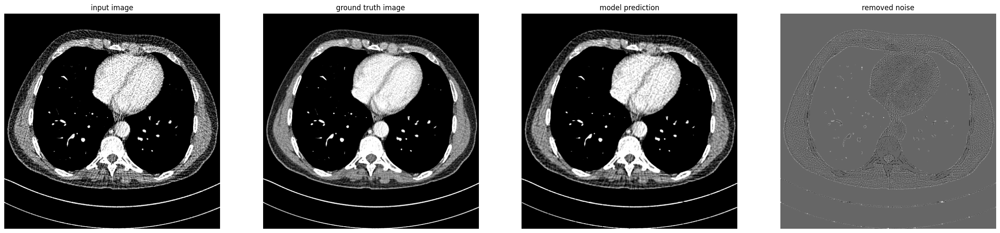

this image has start patches :  64
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.438385273026313
PSNR of noisy image :  23.77072744405735
SSIM of noisy image :  0.8466024
SSIM of reconstructed image :  0.8574983


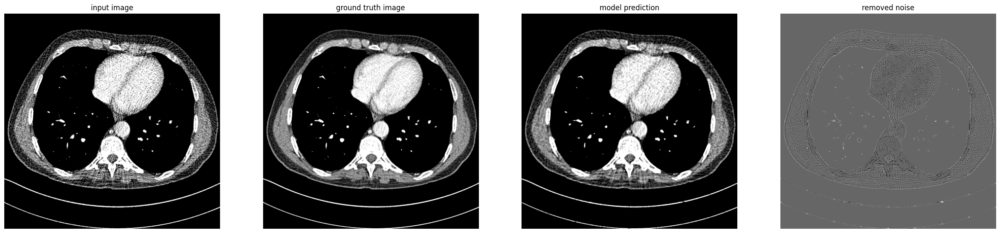

this image has start patches :  128
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.47849209144981
PSNR of noisy image :  23.872244369711602
SSIM of noisy image :  0.84596694
SSIM of reconstructed image :  0.8557107


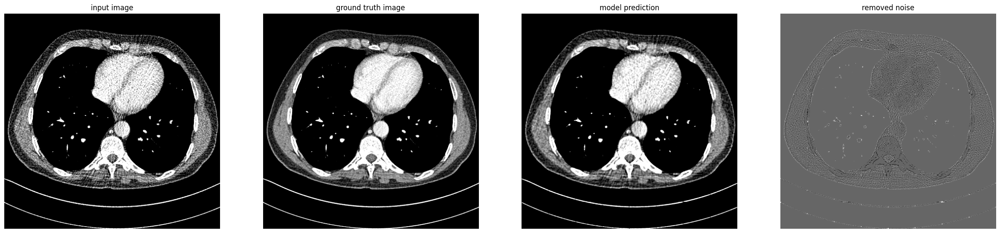

this image has start patches :  192
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.39921613414299
PSNR of noisy image :  23.68181948637809
SSIM of noisy image :  0.84348005
SSIM of reconstructed image :  0.8551441


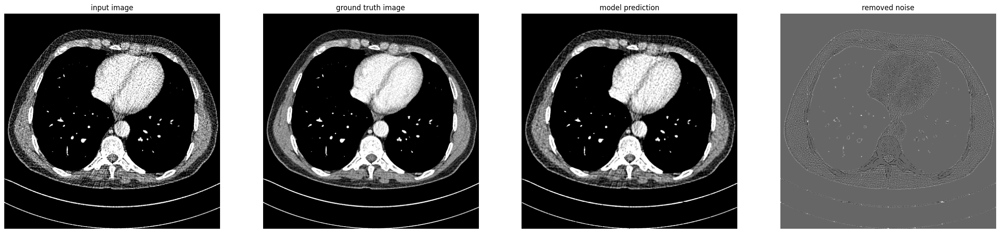

this image has start patches :  256
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.68029013207221
PSNR of noisy image :  23.979451548330296
SSIM of noisy image :  0.8488928
SSIM of reconstructed image :  0.860345


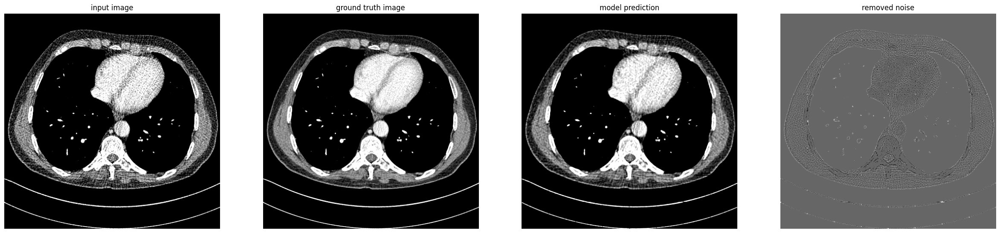

this image has start patches :  320
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.887463993686737
PSNR of noisy image :  24.178606306101663
SSIM of noisy image :  0.8512244
SSIM of reconstructed image :  0.8633792


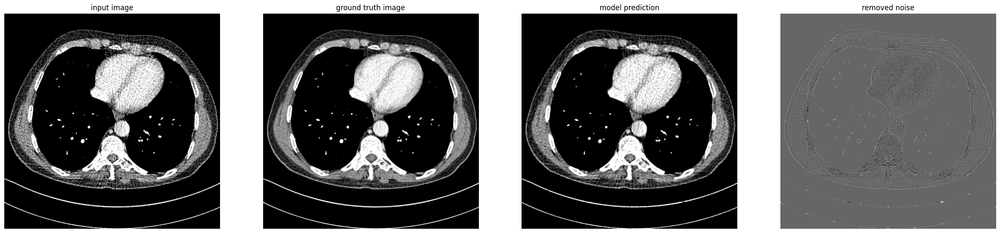

this image has start patches :  384
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.75296822147999
PSNR of noisy image :  23.928403306314998
SSIM of noisy image :  0.8495585
SSIM of reconstructed image :  0.86340195


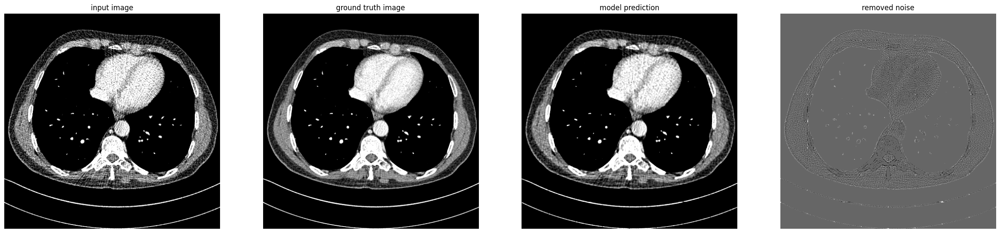

this image has start patches :  448
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.907094826747034
PSNR of noisy image :  24.188060278312804
SSIM of noisy image :  0.85253966
SSIM of reconstructed image :  0.86505944


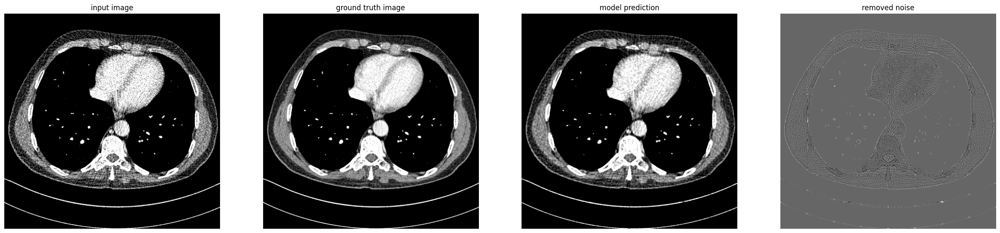

this image has start patches :  512
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.998777030041627
PSNR of noisy image :  24.267820089605138
SSIM of noisy image :  0.85317534
SSIM of reconstructed image :  0.8660106


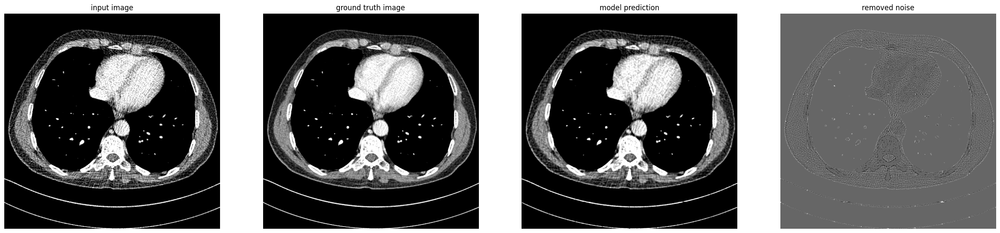

this image has start patches :  576
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.786541566616627
PSNR of noisy image :  24.01930346507163
SSIM of noisy image :  0.8521291
SSIM of reconstructed image :  0.86480546


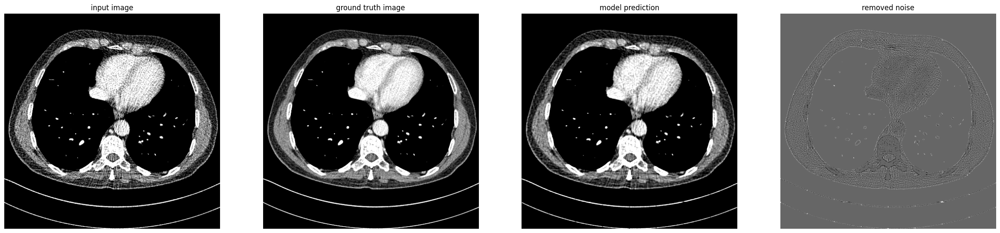

this image has start patches :  640
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  25.706641725324264
PSNR of noisy image :  23.769318678026554
SSIM of noisy image :  0.8361802
SSIM of reconstructed image :  0.8513148


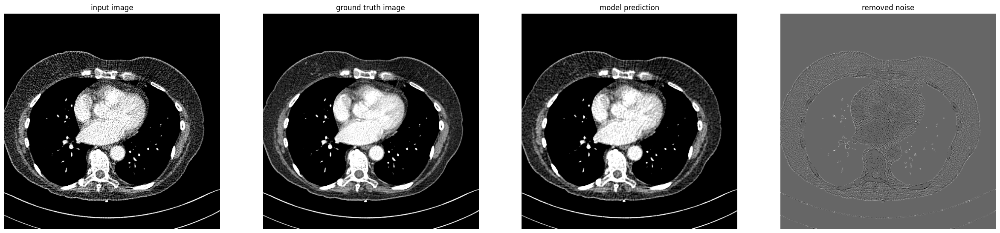

this image has start patches :  704
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  26.7978076906952
PSNR of noisy image :  24.65118878824463
SSIM of noisy image :  0.7820805
SSIM of reconstructed image :  0.8093356


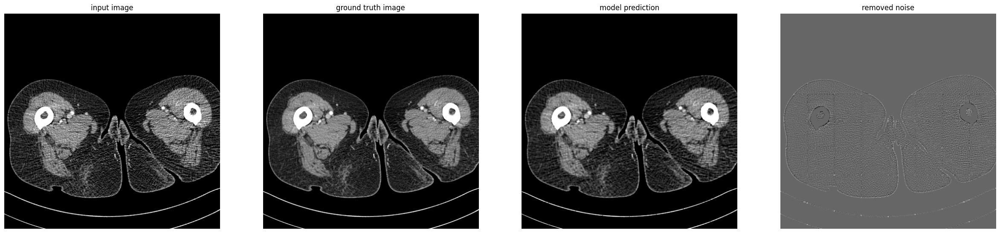

this image has start patches :  768
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  20.216915294004146
PSNR of noisy image :  16.96636129871616
SSIM of noisy image :  0.68414223
SSIM of reconstructed image :  0.6903379


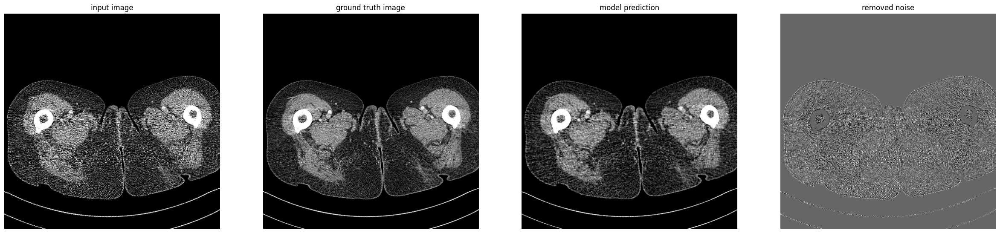

this image has start patches :  832
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  26.690814600218985
PSNR of noisy image :  24.506914598967775
SSIM of noisy image :  0.8172475
SSIM of reconstructed image :  0.8316157


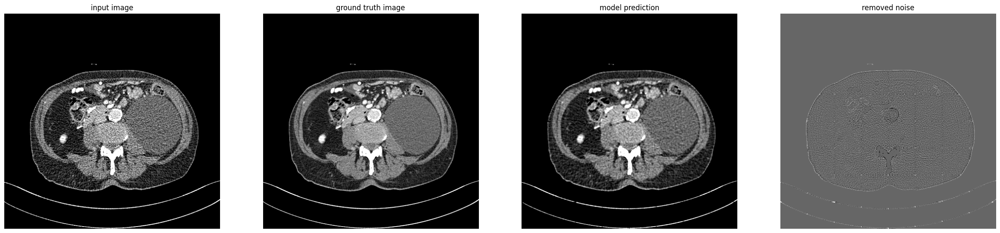

this image has start patches :  896
range of reconstructed image :  -160.0 240.0
range of clean image :  -160.0 240.0
reconstruct_image shape :  (512, 512, 1)
noisy image shape :  (512, 512, 1)
PSNR of reconsturcted image :  26.472395555420437
PSNR of noisy image :  24.71547001596449
SSIM of noisy image :  0.8647461
SSIM of reconstructed image :  0.87251675


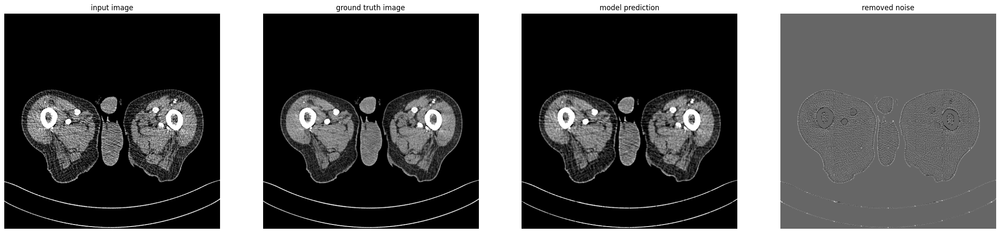

In [8]:
# Get model and build (required for loading weights).
from hformer_model_dk import get_hformer_model

model = get_hformer_model(num_channels_to_be_generated=56, name="hformer_model_extended_56_channel")
model.build(input_shape=(None, 64, 64, 1)) 
model.summary()

# We are required to set custom_objects since we are using custom loss function
loaded_model = model.load_weights('adamw_experimental_results/hformer_64_channel_custom_loss_epochs_12.h5')
#history = np.load('experiment_results/hformer_200_epoch_history_extended_56_channel_reduced_dataset.npy', allow_pickle=True).item()

evaluate_model(model, None, 'hformer_56_extended_partial_epoch', 'psnr')